# Project 7 Segmentation map to road image (pix2pix)

## Rubric:

### 1. pix2pix 모델 학습을 위해 필요한 데이터셋을 적절히 구축하였다. 
- 데이터 분석 과정 및 한 가지 이상의 augmentation을 포함한 데이터셋 구축 과정이 체계적으로 제시되었다.

### 2. pix2pix 모델을 구현하여 성공적으로 학습 과정을 진행하였다.
- U-Net generator, discriminator 모델 구현이 완료되어 train_step의 output을 확인하고 개선하였다.

### 3. 학습 과정 및 테스트에 대한 시각화 결과를 제출하였다. 
- 10 epoch 이상의 학습을 진행한 후 최종 테스트 결과에서 진행한 epoch 수에 걸맞은 정도의 품질을 확인하였다.



In [1]:
import numpy
import tensorflow as tf

print(numpy.__version__)
print(tf.__version__)

1.21.4
2.6.0


## 1) Data

In [2]:
import os

dir_path = './cityscapes'
train_path = os.path.join(dir_path, 'train')
val_path = os.path.join(dir_path, 'val')
print("number of train examples :", len(os.listdir(train_path)))
print("number of val examples :", len(os.listdir(val_path)))

number of train examples : 1000
number of val examples : 5


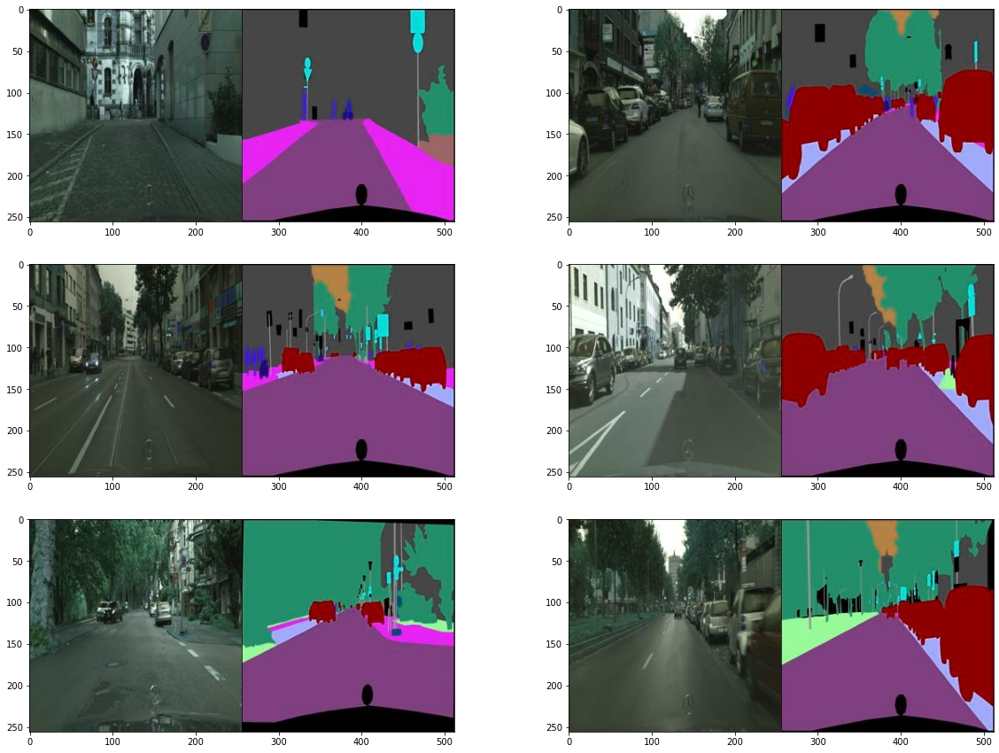

In [3]:
# data check

import cv2
import numpy as np
import matplotlib.pyplot as plt
import glob


train_files = glob.glob(f"{train_path}/*")
# train data 랜덤하게 6장 확인 

plt.figure(figsize=(20,15))
for i in range(1, 7):
    f = train_files[np.random.randint(len(train_files))]
    img = cv2.imread(f, cv2.IMREAD_COLOR)
    plt.subplot(3,2,i)
    plt.imshow(img)

In [4]:
f = os.path.join(train_path, os.listdir(train_path)[0])
img = cv2.imread(f, cv2.IMREAD_COLOR)
print(img.shape)  # (256, 512, 3) <- need to split at second axis

(256, 512, 3)


(256, 256, 3)
(256, 256, 3)


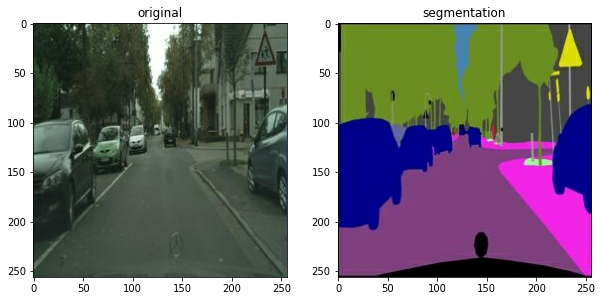

In [5]:
# preprocess

def normalize(x):
    x = tf.cast(x, tf.float32)
    return (x/127.5) - 1

def denormalize(x):
    x = (x+1)*127.5
    x = x.numpy()
    return x.astype(np.uint8)

def load_img(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, 3)
    
    w = tf.shape(img)[1] // 2     
    orig = img[:, :w, :] 
    orig = tf.cast(orig, tf.float32)    # split & change type
    seg = img[:, w:, :]  
    seg = tf.cast(seg, tf.float32)      # split & change type
    return normalize(orig), normalize(seg)

f = os.path.join(train_path, os.listdir(train_path)[0])
orig, seg = load_img(f)

plt.figure(figsize=(10,7))
plt.subplot(1,2,1);plt.title('original'); plt.imshow(denormalize(orig))
plt.subplot(1,2,2);plt.title('segmentation'); plt.imshow(denormalize(seg))

print(orig.shape) #(256, 256, 3)
print(seg.shape)  #(256, 256, 3)  well splitted

In [6]:
# Augmentation

from tensorflow import image

@tf.function() # 빠른 텐서플로 연산을 위해 @tf.function()을 사용합니다. 
def apply_augmentation(seg, orig):
    stacked = tf.concat([seg, orig], axis=-1)
    
    _pad = tf.constant([[30,30],[30,30],[0,0]])
    if tf.random.uniform(()) < .5:
        padded = tf.pad(stacked, _pad, "REFLECT")    # pad with reflection
    else:
        padded = tf.pad(stacked, _pad, "CONSTANT", constant_values=1.)  #pad white

    out = image.random_crop(padded, size=[256, 256, 6])
    
    out = image.random_flip_left_right(out)        # flip left & right
    out = image.random_flip_up_down(out)           # flip up & down
    
    if tf.random.uniform(()) < .5:
        degree = tf.random.uniform([], minval=1, maxval=4, dtype=tf.int32)
        out = image.rot90(out, k=degree)
    
    return out[...,:3], out[...,3:]

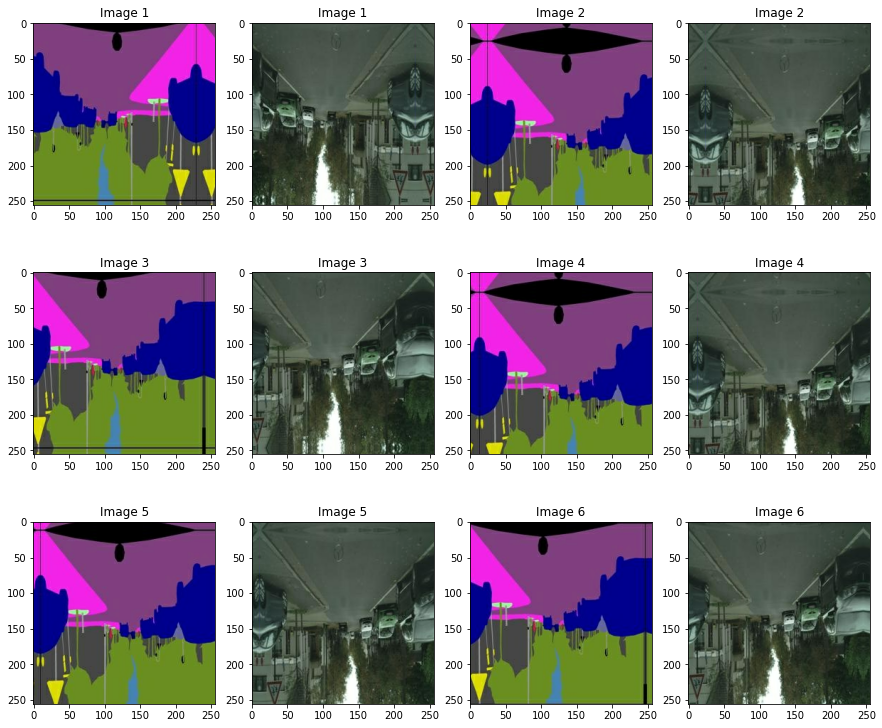

In [7]:
plt.figure(figsize=(15,13))
img_n = 1
for i in range(1, 13, 2):
    augmented_seg, augmented_orig = apply_augmentation(seg, orig)
    
    plt.subplot(3,4,i)
    plt.imshow(denormalize(augmented_seg)); plt.title(f"Image {img_n}")
    plt.subplot(3,4,i+1); 
    plt.imshow(denormalize(augmented_orig)); plt.title(f"Image {img_n}")
    img_n += 1

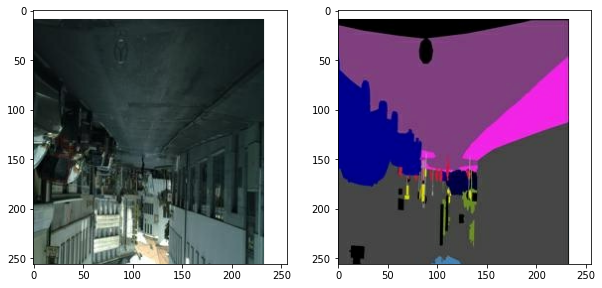

In [8]:
from tensorflow import data

def get_train(img_path):
    seg, orig = load_img(img_path)
    seg, orig = apply_augmentation(seg, orig)
    return seg, orig

train_images = data.Dataset.list_files(train_path + "/*.jpg")
train_images = train_images.map(get_train).shuffle(100).batch(4)

# check

sample = train_images.take(1)
sample = list(sample.as_numpy_iterator())
seg, orig = (sample[0][0]+1)*127.5, (sample[0][1]+1)*127.5

plt.figure(figsize=(10,5))
plt.subplot(1,2,1); plt.imshow(seg[0].astype(np.uint8))
plt.subplot(1,2,2); plt.imshow(orig[0].astype(np.uint8))

## 2) U-Net Generator

In [9]:
from tensorflow.keras import layers, Input, Model

class EncodeBlock(layers.Layer):
    def __init__(self, n_filters, use_bn=True):
        super(EncodeBlock, self).__init__()
        self.use_bn = use_bn       
        self.conv = layers.Conv2D(n_filters, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.lrelu = layers.LeakyReLU(0.2)

    def call(self, x):
        x = self.conv(x)
        if self.use_bn:
            x = self.batchnorm(x)
        return self.lrelu(x)

    
class DecodeBlock(layers.Layer):
    def __init__(self, f, dropout=True):
        super(DecodeBlock, self).__init__()
        self.dropout = dropout
        self.Transconv = layers.Conv2DTranspose(f, 4, 2, "same", use_bias=False)
        self.batchnorm = layers.BatchNormalization()
        self.relu = layers.ReLU()
        
    def call(self, x):
        x = self.Transconv(x)
        x = self.batchnorm(x)
        if self.dropout:
            x = layers.Dropout(.5)(x)
        return self.relu(x)
    

In [10]:
class UNetGenerator(Model):
    def __init__(self):
        super(UNetGenerator, self).__init__()
        encode_filters = [64,128,256,512,512,512,512,512]
        decode_filters = [512,512,512,512,256,128,64]
        
        self.encode_blocks = []
        for i, f in enumerate(encode_filters):
            if i == 0:
                self.encode_blocks.append(EncodeBlock(f, use_bn=False))
            else:
                self.encode_blocks.append(EncodeBlock(f))
        
        self.decode_blocks = []
        for i, f in enumerate(decode_filters):
            if i < 3:
                self.decode_blocks.append(DecodeBlock(f))
            else:
                self.decode_blocks.append(DecodeBlock(f, dropout=False))
        
        self.last_conv = layers.Conv2DTranspose(3, 4, 2, "same", use_bias=False)
    
    def call(self, x):
        features = []
        for block in self.encode_blocks:
            x = block(x)
            features.append(x)
        
        features = features[:-1]
                    
        for block, feat in zip(self.decode_blocks, features[::-1]):
            x = block(x)
            x = layers.Concatenate()([x, feat])
        
        x = self.last_conv(x)
        return x
                
    def get_summary(self, input_shape=(256,256,3)):
        inputs = Input(input_shape)
        return Model(inputs, self.call(inputs)).summary()

In [11]:
UNetGenerator().get_summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
encode_block (EncodeBlock)      (None, 128, 128, 64) 3072        input_1[0][0]                    
__________________________________________________________________________________________________
encode_block_1 (EncodeBlock)    (None, 64, 64, 128)  131584      encode_block[0][0]               
__________________________________________________________________________________________________
encode_block_2 (EncodeBlock)    (None, 32, 32, 256)  525312      encode_block_1[0][0]             
______________________________________________________________________________________________

In [12]:
class DiscBlock(layers.Layer):
    def __init__(self, n_filters, stride=2, custom_pad=False, use_bn=True, act=True):
        super(DiscBlock, self).__init__()
        self.custom_pad = custom_pad
        self.use_bn = use_bn
        self.act = act
        
        if custom_pad:
            self.padding = layers.ZeroPadding2D()
            self.conv = layers.Conv2D(n_filters, 4, stride, "valid", use_bias=False)
        else:
            self.conv = layers.Conv2D(n_filters, 4, stride, "same", use_bias=False)
        
        self.batchnorm = layers.BatchNormalization() if use_bn else None
        self.lrelu = layers.LeakyReLU(0.2) if act else None
        
    def call(self, x):
        if self.custom_pad:
            x = self.padding(x)
            x = self.conv(x)
        else:
            x = self.conv(x)
                
        if self.use_bn:
            x = self.batchnorm(x)
            
        if self.act:
            x = self.lrelu(x)
        return x 


## 3) Discriminator

In [13]:
class Discriminator(Model):
    def __init__(self):
        super(Discriminator, self).__init__()
        
        filters = [64,128,256,512,1]
        self.blocks = [layers.Concatenate()]
       
        for i, f in enumerate(filters):
            self.blocks.append(DiscBlock(f, stride=2 if i<3 else 1, custom_pad=i>=2, use_bn=i not in [0,4], act=i<4))
        self.sigmoid = layers.Activation('sigmoid')


    def call(self, x, y):
        out = self.blocks[0]([x, y])
        for block in self.blocks[1:]:
            out = block(out)
        return self.sigmoid(out)
    
    def get_summary(self, x_shape=(256,256,3), y_shape=(256,256,3)):
        x, y = Input(x_shape), Input(y_shape) 
        return Model((x, y), self.call(x, y)).summary()
    

In [14]:
Discriminator().get_summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
concatenate_7 (Concatenate)     (None, 256, 256, 6)  0           input_2[0][0]                    
                                                                 input_3[0][0]                    
__________________________________________________________________________________________________
disc_block (DiscBlock)          (None, 128, 128, 64) 6144        concatenate_7[0][0]        

## 4) GAN train-step

In [15]:
from tensorflow.keras import losses

bce = losses.BinaryCrossentropy(from_logits=False)
mae = losses.MeanAbsoluteError()

def get_gene_loss(fake_output, real_output, fake_disc):
    l1_loss = mae(real_output, fake_output)
    gene_loss = bce(tf.ones_like(fake_disc), fake_disc)
    return gene_loss, l1_loss

def get_disc_loss(fake_disc, real_disc):
    return bce(tf.zeros_like(fake_disc), fake_disc) + bce(tf.ones_like(real_disc), real_disc)

In [16]:
from tensorflow.keras import optimizers

gene_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)
disc_opt = optimizers.Adam(2e-4, beta_1=.5, beta_2=.999)


In [17]:
@tf.function
def train_step(seg, orig):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
    
        fake_pic = generator(seg, training=True)
        # Discriminator 예측
        fake_disc = discriminator(seg, fake_pic, training=True)
        real_disc = discriminator(seg, orig, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_pic, orig, fake_disc)
        gene_total_loss = gene_loss + (5 * l1_loss) ## L1, λ=5
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)

    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss


In [18]:
#epoch => 1

EPOCHS = 1

generator = UNetGenerator()
discriminator = Discriminator()
history = {'gen_loss':[], 'l1_loss':[], 'disc_loss':[]}

for epoch in range(1, EPOCHS+1):
    for i, (orig, seg) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(seg, orig)
        history['gen_loss'].append(g_loss)
        history['l1_loss'].append(l1_loss)
        history['disc_loss'].append(d_loss)
                
        # 1 epoch마다 손실을 출력합니다.
        if (i+1) % 250 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[250]                     
Generator_loss:0.7324                     
L1_loss:0.2286                     
Discriminator_loss:1.3525



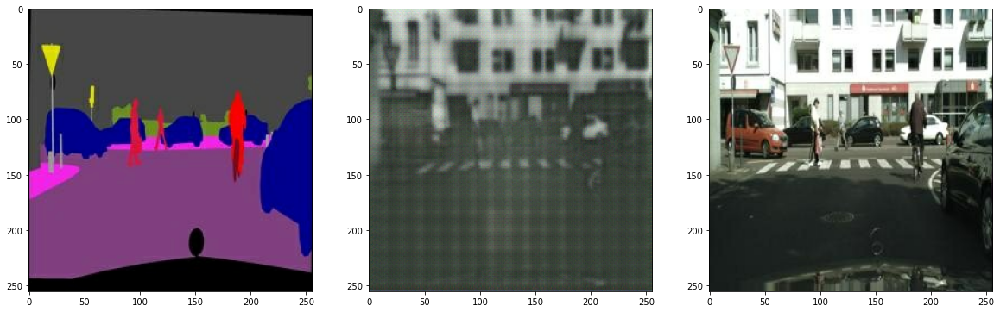

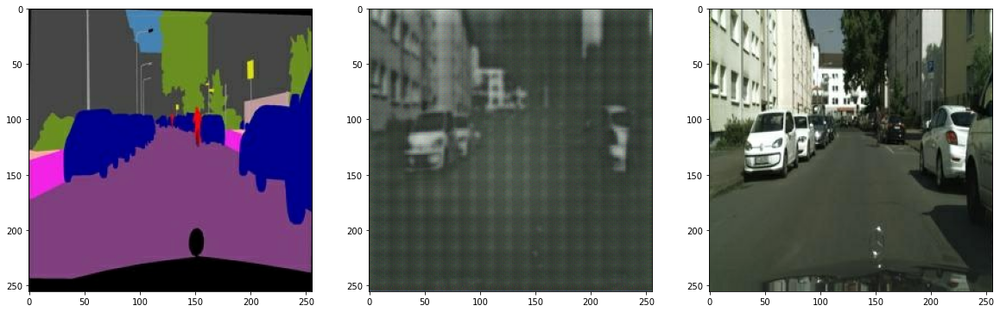

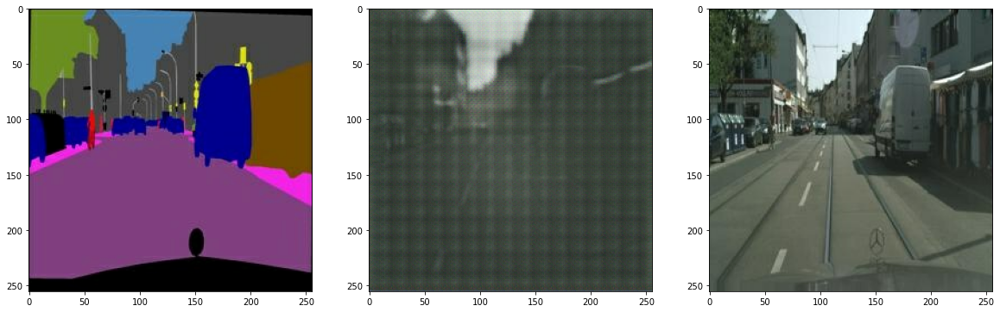

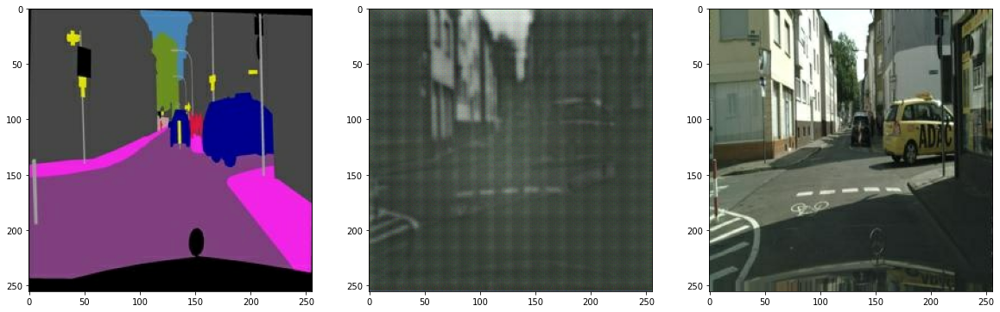

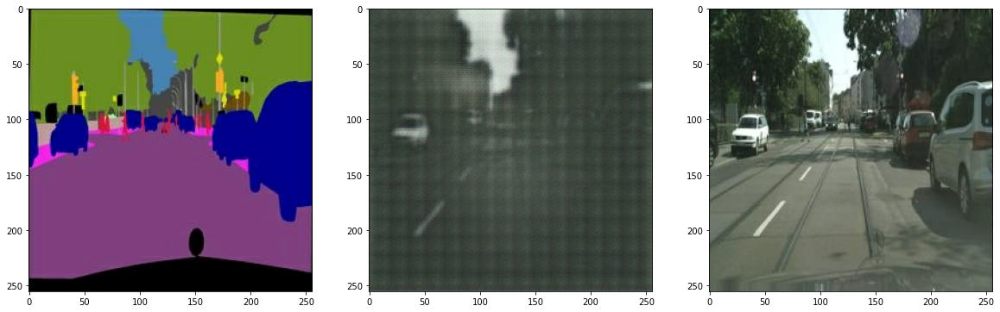

In [19]:
for test_ind in range(5):
    f = glob.glob(f"{val_path}/*")[test_ind]
    seg, orig = load_img(f)

    pred = generator(tf.expand_dims(seg, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(orig))
    plt.subplot(1,3,2); plt.imshow(pred[0])
    plt.subplot(1,3,3); plt.imshow(denormalize(seg))

- epoch 1 result: 흐릿한 사진에 체크무늬 관찰됨, 채도가 낮음, 그래도 형태를 관측할 수 있다.

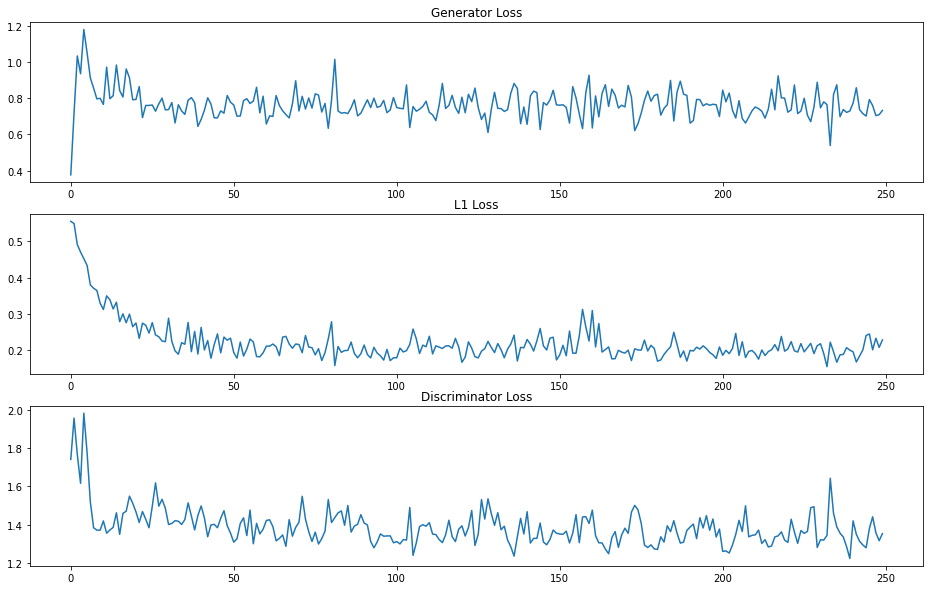

In [20]:
plt.figure(figsize=(16,10))

plt.subplot(311)
plt.plot(history['gen_loss'])
plt.title('Generator Loss')

plt.subplot(312)
plt.plot(history['l1_loss'])
plt.title('L1 Loss')

plt.subplot(313)
plt.plot(history['disc_loss'])
plt.title('Discriminator Loss')

plt.show()

In [21]:
@tf.function
def train_step(seg, orig):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
    
        fake_pic = generator(seg, training=True)
        # Discriminator 예측
        fake_disc = discriminator(seg, fake_pic, training=True)
        real_disc = discriminator(seg, orig, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_pic, orig, fake_disc)
        gene_total_loss = gene_loss + (5 * l1_loss) ## L1, λ=5
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)

    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss


In [22]:
#epoch => 10

EPOCHS = 10

generator = UNetGenerator()
discriminator = Discriminator()
history = {'gen_loss':[], 'l1_loss':[], 'disc_loss':[]}

for epoch in range(1, EPOCHS+1):
    for i, (orig, seg) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(seg, orig)
        history['gen_loss'].append(g_loss)
        history['l1_loss'].append(l1_loss)
        history['disc_loss'].append(d_loss)
                
        # 50회 반복마다 손실을 출력합니다.
        if (i+1) % 250 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[250]                     
Generator_loss:0.7290                     
L1_loss:0.1876                     
Discriminator_loss:1.2831

EPOCH[2] - STEP[250]                     
Generator_loss:0.7079                     
L1_loss:0.1718                     
Discriminator_loss:1.3143

EPOCH[3] - STEP[250]                     
Generator_loss:0.6727                     
L1_loss:0.1911                     
Discriminator_loss:1.6187

EPOCH[4] - STEP[250]                     
Generator_loss:0.6577                     
L1_loss:0.1927                     
Discriminator_loss:1.3423

EPOCH[5] - STEP[250]                     
Generator_loss:0.7837                     
L1_loss:0.2364                     
Discriminator_loss:1.2767

EPOCH[6] - STEP[250]                     
Generator_loss:0.7040                     
L1_loss:0.2295                     
Discriminator_loss:1.6182

EPOCH[7] - STEP[250]                     
Generator_loss:0.8134                     
L1_loss:0.1926             

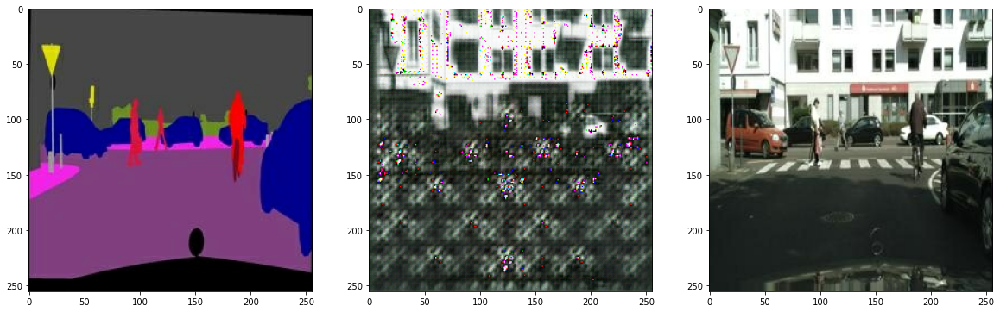

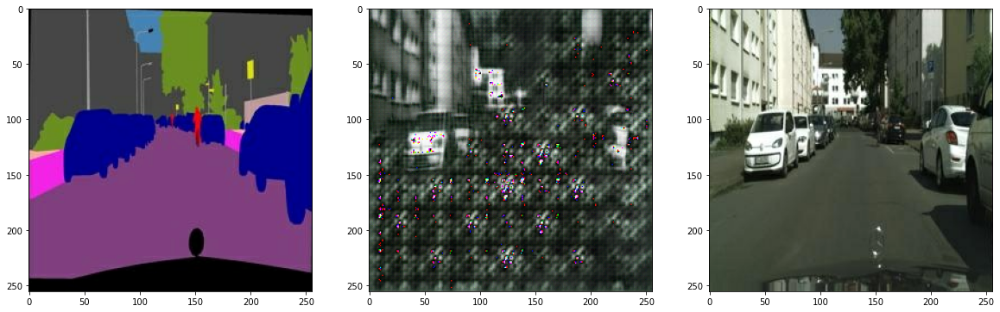

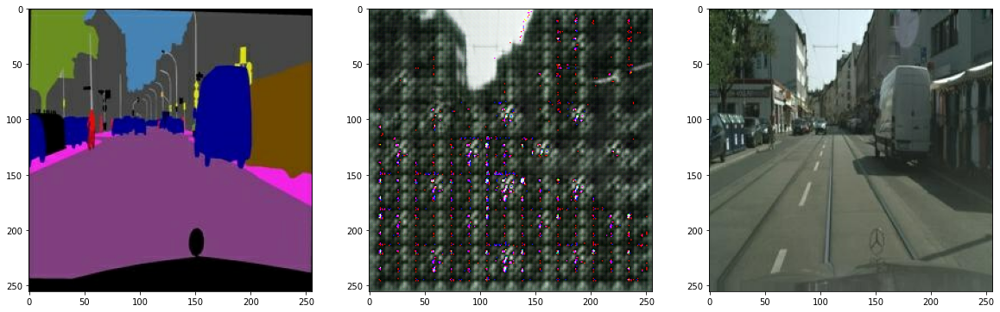

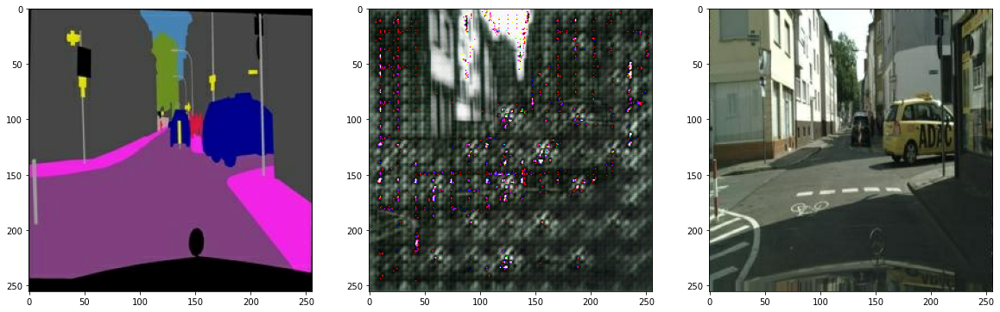

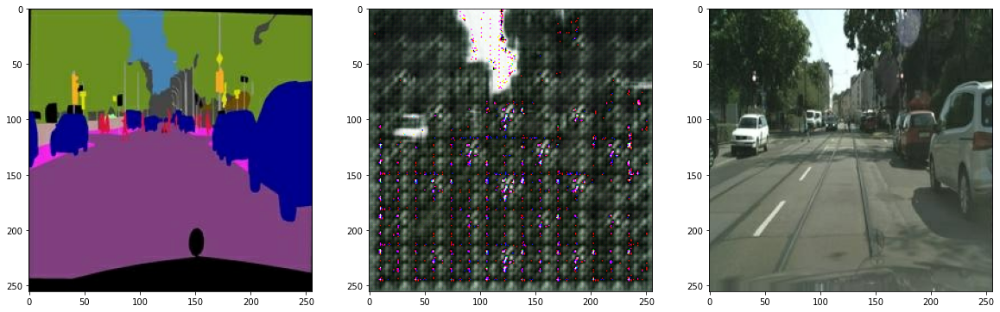

In [23]:
for test_ind in range(5):
    f = glob.glob(f"{val_path}/*")[test_ind]
    seg, orig = load_img(f)

    pred = generator(tf.expand_dims(seg, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(orig))
    plt.subplot(1,3,2); plt.imshow(pred[0])
    plt.subplot(1,3,3); plt.imshow(denormalize(seg))

- epoch 10 result: 상대적으로 뚜렷한 사진, 규칙적인 물결무늬 관찰됨, 채도가 낮음, 체크무늬가 형상을 알아보는데 방해하고 있다.

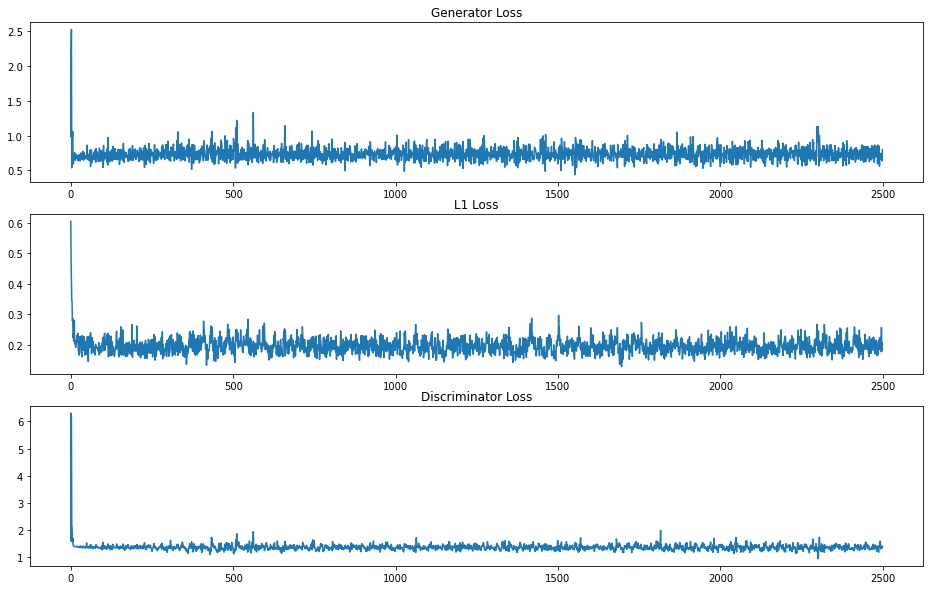

In [24]:
plt.figure(figsize=(16,10))

plt.subplot(311)
plt.plot(history['gen_loss'])
plt.title('Generator Loss')

plt.subplot(312)
plt.plot(history['l1_loss'])
plt.title('L1 Loss')

plt.subplot(313)
plt.plot(history['disc_loss'])
plt.title('Discriminator Loss')

plt.show()

In [25]:
@tf.function
def train_step(seg, orig):
    with tf.GradientTape() as gene_tape, tf.GradientTape() as disc_tape:
    
        fake_pic = generator(seg, training=True)
        # Discriminator 예측
        fake_disc = discriminator(seg, fake_pic, training=True)
        real_disc = discriminator(seg, orig, training=True)
        # Generator 손실 계산
        gene_loss, l1_loss = get_gene_loss(fake_pic, orig, fake_disc)
        gene_total_loss = gene_loss + (5 * l1_loss) ## L1, λ=5
        # Discrminator 손실 계산
        disc_loss = get_disc_loss(fake_disc, real_disc)

    gene_gradient = gene_tape.gradient(gene_total_loss, generator.trainable_variables)
    disc_gradient = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    gene_opt.apply_gradients(zip(gene_gradient, generator.trainable_variables))
    disc_opt.apply_gradients(zip(disc_gradient, discriminator.trainable_variables))
    return gene_loss, l1_loss, disc_loss


In [26]:
#epoch => 100

EPOCHS = 100

generator = UNetGenerator()
discriminator = Discriminator()
history = {'gen_loss':[], 'l1_loss':[], 'disc_loss':[]}

for epoch in range(1, EPOCHS+1):
    for i, (orig, seg) in enumerate(train_images):
        g_loss, l1_loss, d_loss = train_step(seg, orig)
        history['gen_loss'].append(g_loss)
        history['l1_loss'].append(l1_loss)
        history['disc_loss'].append(d_loss)
                
        # 50회 반복마다 손실을 출력합니다.
        if (i+1) % 250 == 0:
            print(f"EPOCH[{epoch}] - STEP[{i+1}] \
                    \nGenerator_loss:{g_loss.numpy():.4f} \
                    \nL1_loss:{l1_loss.numpy():.4f} \
                    \nDiscriminator_loss:{d_loss.numpy():.4f}", end="\n\n")

EPOCH[1] - STEP[250]                     
Generator_loss:0.8375                     
L1_loss:0.1816                     
Discriminator_loss:1.4129

EPOCH[2] - STEP[250]                     
Generator_loss:0.7805                     
L1_loss:0.1745                     
Discriminator_loss:1.3186

EPOCH[3] - STEP[250]                     
Generator_loss:0.6209                     
L1_loss:0.2550                     
Discriminator_loss:1.4004

EPOCH[4] - STEP[250]                     
Generator_loss:0.7588                     
L1_loss:0.1586                     
Discriminator_loss:1.3188

EPOCH[5] - STEP[250]                     
Generator_loss:0.8591                     
L1_loss:0.2191                     
Discriminator_loss:1.3961

EPOCH[6] - STEP[250]                     
Generator_loss:0.7869                     
L1_loss:0.2138                     
Discriminator_loss:1.4844

EPOCH[7] - STEP[250]                     
Generator_loss:0.8551                     
L1_loss:0.2406             

EPOCH[57] - STEP[250]                     
Generator_loss:0.9467                     
L1_loss:0.1810                     
Discriminator_loss:1.3709

EPOCH[58] - STEP[250]                     
Generator_loss:0.6086                     
L1_loss:0.2206                     
Discriminator_loss:1.4414

EPOCH[59] - STEP[250]                     
Generator_loss:0.6599                     
L1_loss:0.2145                     
Discriminator_loss:1.1922

EPOCH[60] - STEP[250]                     
Generator_loss:0.7805                     
L1_loss:0.2152                     
Discriminator_loss:1.3083

EPOCH[61] - STEP[250]                     
Generator_loss:0.8939                     
L1_loss:0.1582                     
Discriminator_loss:1.2729

EPOCH[62] - STEP[250]                     
Generator_loss:1.0635                     
L1_loss:0.1654                     
Discriminator_loss:1.4393

EPOCH[63] - STEP[250]                     
Generator_loss:0.7855                     
L1_loss:0.1933      

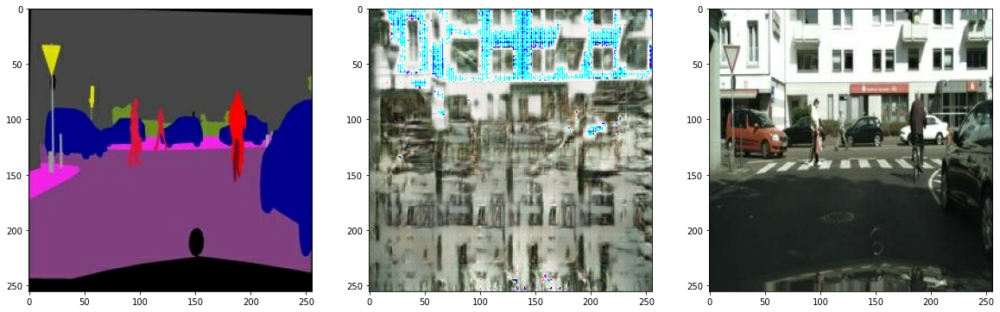

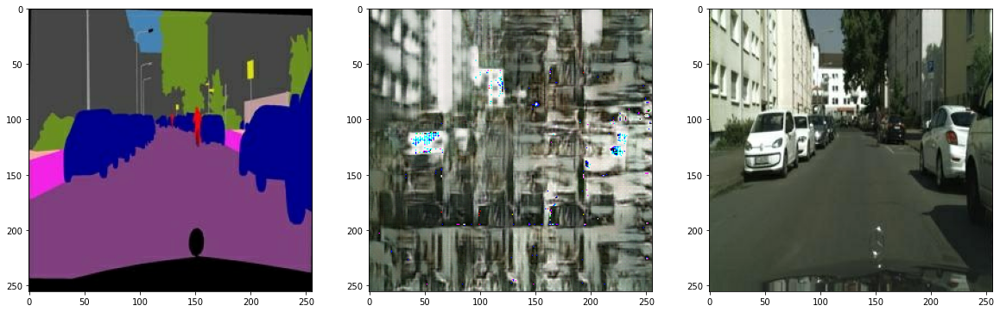

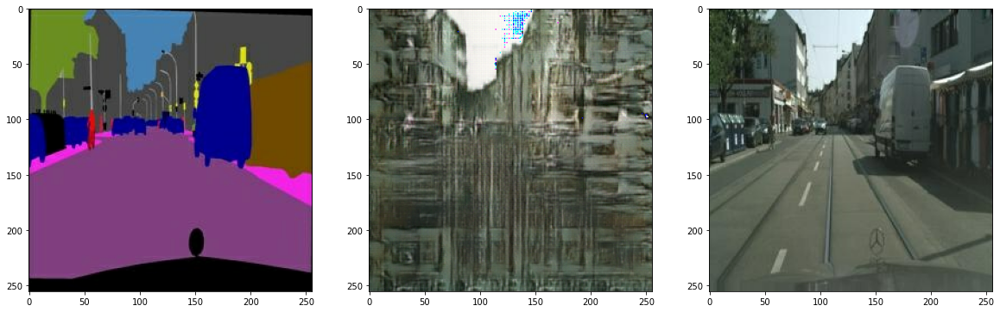

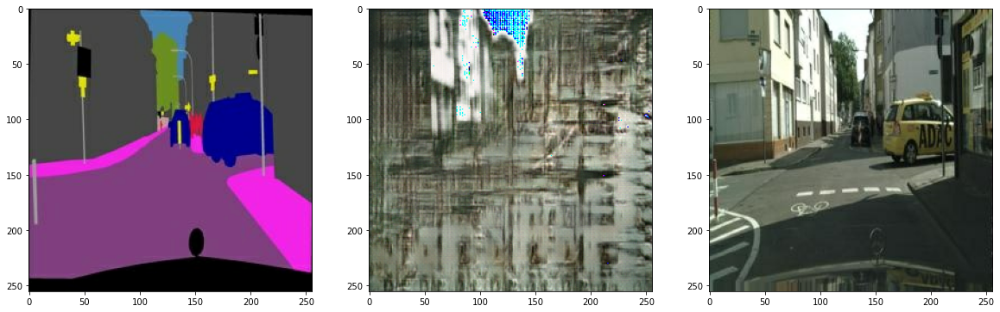

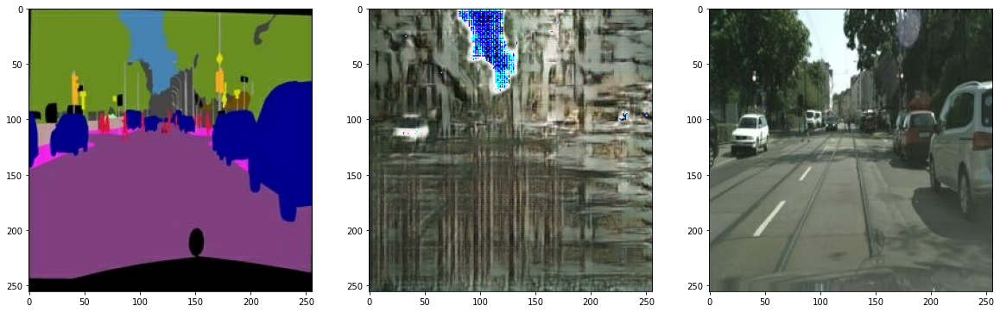

In [27]:
for test_ind in range(5):
    f = glob.glob(f"{val_path}/*")[test_ind]
    seg, orig = load_img(f)

    pred = generator(tf.expand_dims(seg, 0))
    pred = denormalize(pred)

    plt.figure(figsize=(20,10))
    plt.subplot(1,3,1); plt.imshow(denormalize(orig))
    plt.subplot(1,3,2); plt.imshow(pred[0])
    plt.subplot(1,3,3); plt.imshow(denormalize(seg))

- epoch 100 result: 높아진 명도, overfitting 돼서 체크무늬가 사진을 잡아먹었다, 채도가 상대적으로 높아짐, 형상의 대부분을 .

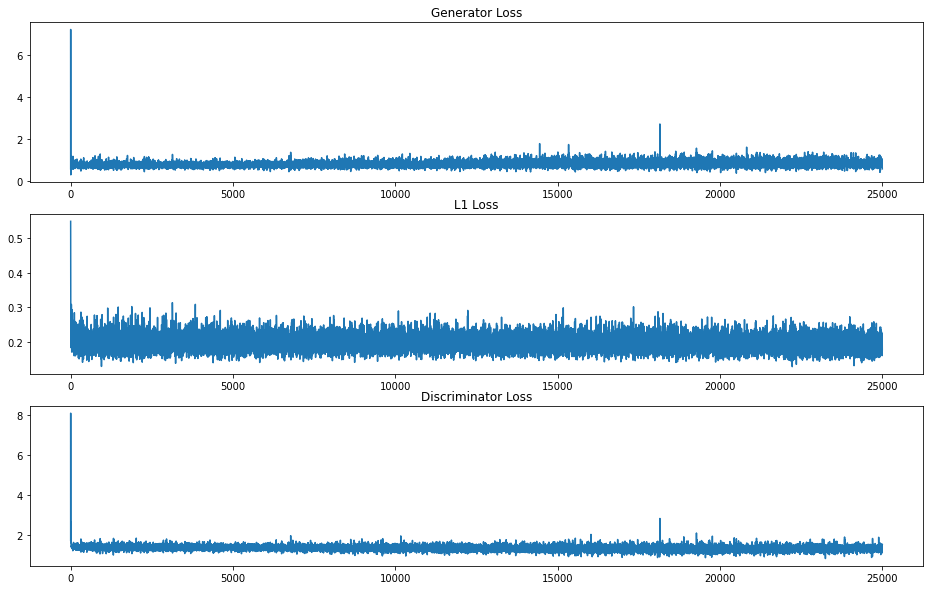

In [28]:
plt.figure(figsize=(16,10))

plt.subplot(311)
plt.plot(history['gen_loss'])
plt.title('Generator Loss')

plt.subplot(312)
plt.plot(history['l1_loss'])
plt.title('L1 Loss')

plt.subplot(313)
plt.plot(history['disc_loss'])
plt.title('Discriminator Loss')

plt.show()